In [7]:
import pandas as pd
import yfinance as yf
import numpy as np
import matplotlib.pyplot as plt
import datetime as dt
import matplotlib

In [23]:
start = dt.datetime(2022, 1, 1)
end = dt.datetime.now()
lookback = dt.timedelta(days=1000)
asset = 'BTC-USD'
num_simulations = 1000
num_days = 30

In [39]:
stock = yf.download(asset, start=end - lookback, end=end) # Download all columns instead of just 'Close'
returns = stock['Close'].pct_change()  # Calculate returns using 'Close' column
log_ret = pd.DataFrame([np.log(1 + x) for x in returns.values])
mu, sigma = returns.mean(), returns.std()
avg = stock['Close'].mean()  # Calculate average using 'Close' column
vol = stock['Close'].std()  # Calculate volatility using 'Close' column
print(avg, vol)

[*********************100%***********************]  1 of 1 completed

Ticker
BTC-USD    44510.613215
dtype: float64 Ticker
BTC-USD    25314.670175
dtype: float64


In [40]:
last_price = stock['Close'].iloc[-1]  # Get the last price from the 'Close' column
date = pd.date_range(start=end, periods=num_days, freq='D')  # Create date range for index
res = pd.DataFrame(index=date, columns=range(num_simulations))  # Initialize DataFrame correctly

plt.figure(dpi=400)

<Figure size 2560x1920 with 0 Axes>

<Figure size 2560x1920 with 0 Axes>

In [44]:
# Run simulations
for x in range(num_simulations):
    sim_ret = np.random.normal(mu, sigma, num_days)  # Generate random returns
    sim_prices = last_price.iloc[0] * (1 + sim_ret).cumprod()  # Compute simulated prices, using .iloc[0] to get the scalar value
    res.iloc[:, x] = sim_prices  # Assign correctly using .iloc

Text(0.89, 0.84, 'Expected price on the last day is 93112\n95% Prediction interval: (65517, 120708)')

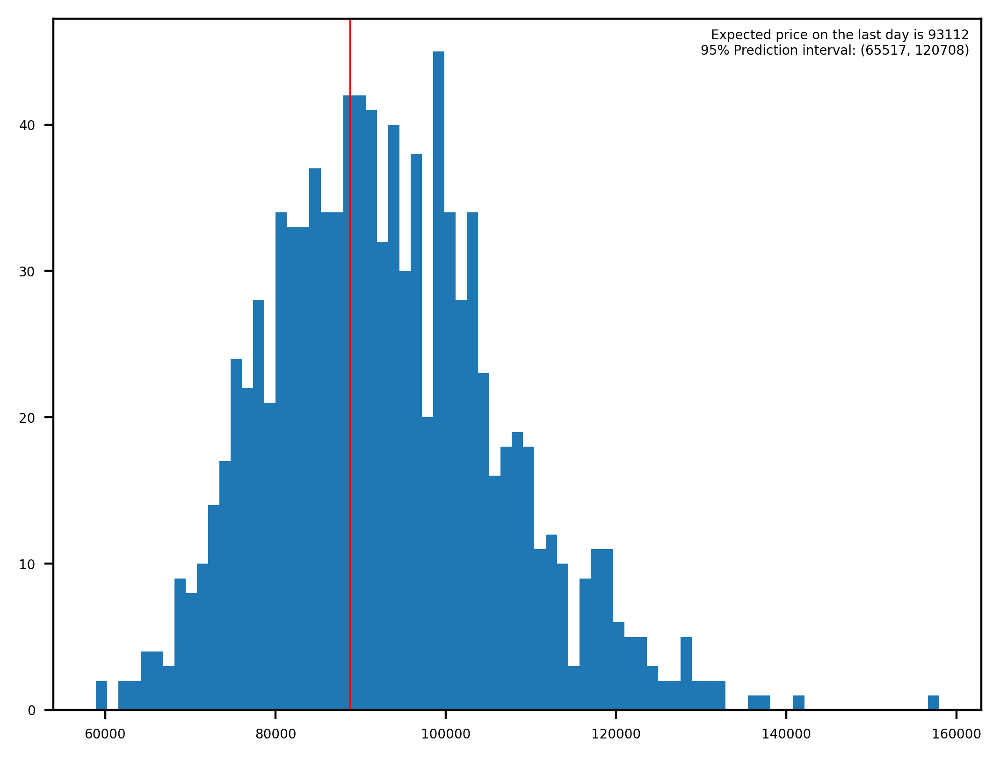

In [46]:
last_day = res.iloc[-1]
plt.figure(dpi=400)
plt.hist(last_day, bins=75)
# Access the last closing price using .iloc[-1] on the 'Close' column and extract the scalar value using .item()
plt.axvline(stock['Close'].iloc[-1].item(), color='red', linestyle='-', linewidth='0.6')
string = f"Expected price on the last day is {round(last_day.mean())}\n95% Prediction interval: {round(last_day.mean() - 2 * last_day.std()), round(last_day.mean() + 2 * last_day.std())}"
plt.figtext(x=0.89, y=0.84, s=string, fontsize=5, ha='right')

In [47]:
from matplotlib.animation import FuncAnimation, PillowWriter
from IPython.display import HTML, Image

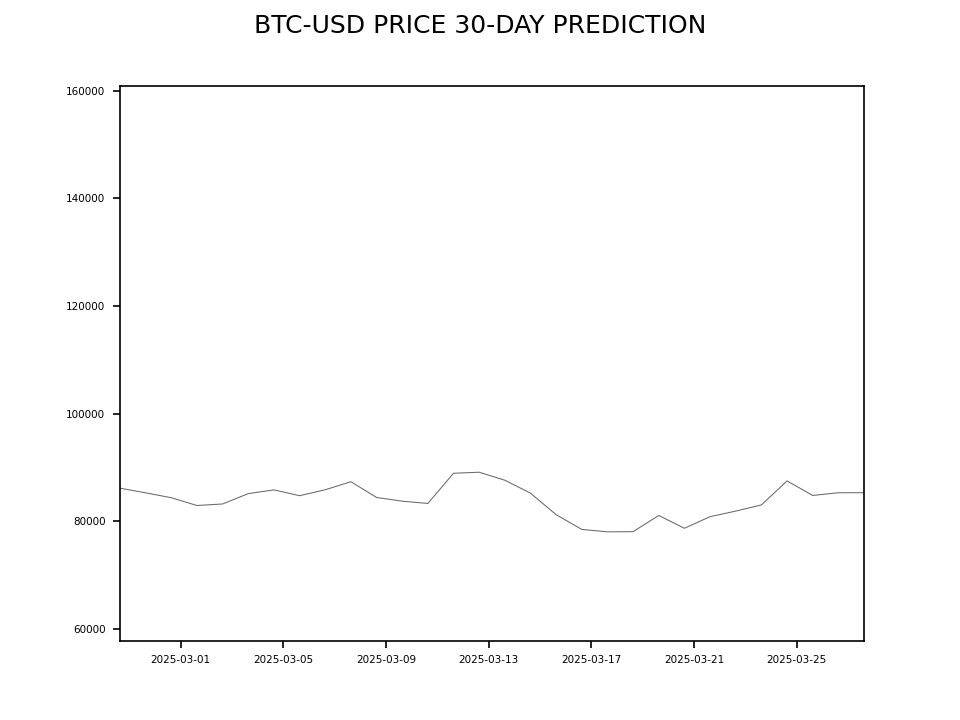

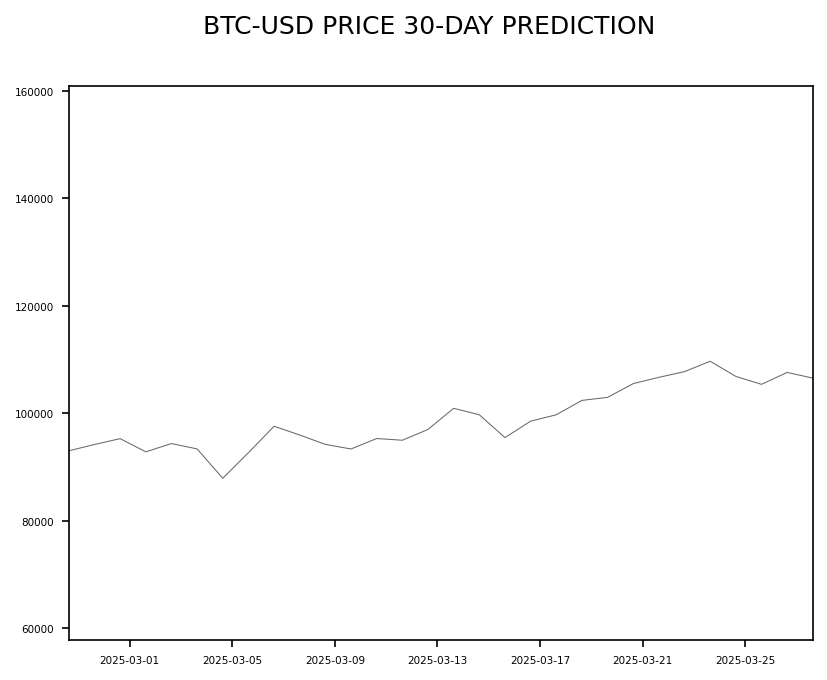

In [48]:

# Assuming 'res' is a DataFrame and 'num_simulations' is defined
fig = plt.figure(dpi=150)
ax = plt.subplot(1, 1, 1)
plt.suptitle(f"{asset} PRICE {num_days}-DAY PREDICTION")

# Initialize the plot
line, = ax.plot([], [], color='dimgray', linewidth=0.5)

def init():
    ax.set_xlim(res.index[0], res.index[-1])
    ax.set_ylim(res.min().min(), res.max().max())  # Set y-limits based on your data
    return line,

def update_plot(i):
    line.set_data(res.index, res.iloc[:, i])  # Assuming res is a DataFrame
    return line,

# Create the animation
anim = FuncAnimation(fig, update_plot, frames=num_simulations, init_func=init, interval=10, blit=True)

# Save the animation using Pillow
anim.save('animation.gif', writer=PillowWriter(fps=10))

# Display the saved animation
Image(filename='animation.gif')

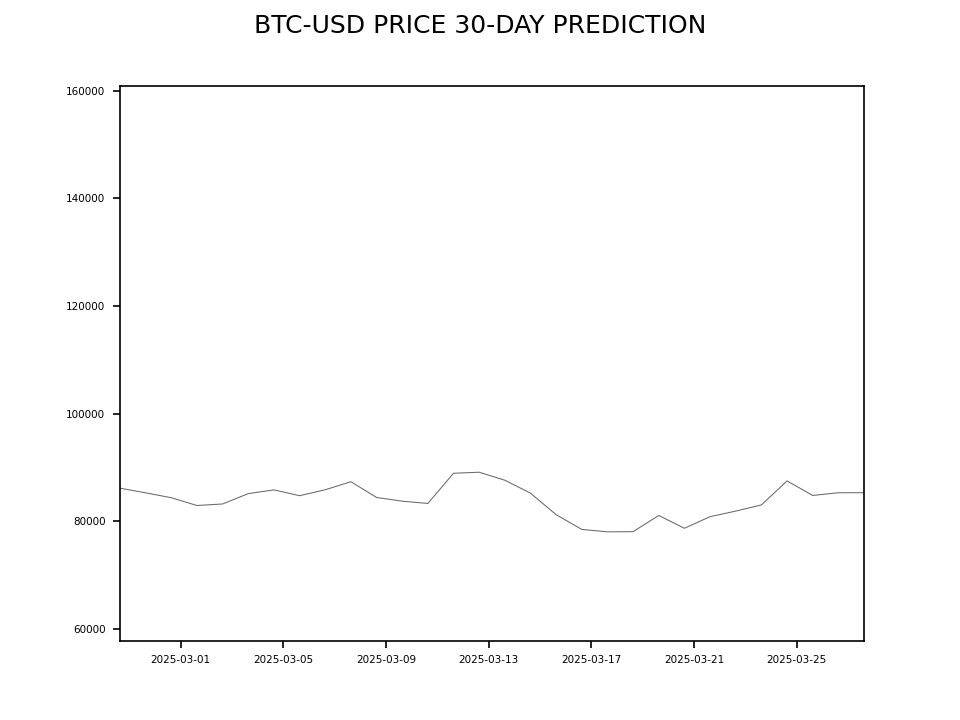

In [49]:
# Display the animation in Jupyter Notebook
from IPython.display import Image
Image(filename='animation.gif')

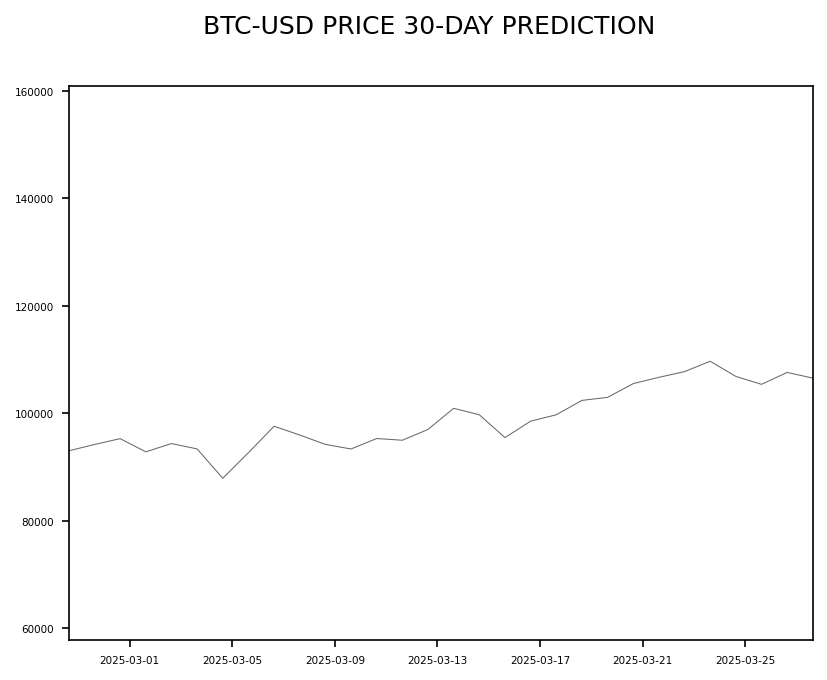

In [50]:
# Assuming 'res' is a DataFrame and 'num_simulations' is defined
fig = plt.figure(dpi=150)
ax = plt.subplot(1, 1, 1)
plt.suptitle(f"{asset} PRICE {num_days}-DAY PREDICTION")

# Initialize the plot
line, = ax.plot([], [], color='dimgray', linewidth=0.5)

def init():
    ax.set_xlim(res.index[0], res.index[-1])
    ax.set_ylim(res.min().min(), res.max().max())  # Set y-limits based on your data
    return line,

def update_plot(i):
    line.set_data(res.index, res.iloc[:, i])  # Assuming res is a DataFrame
    return line,

# Create the animation
anim = FuncAnimation(fig, update_plot, frames=num_simulations, init_func=init, interval=10, blit=True)

# Display the animation
HTML(anim.to_html5_video())